# Importing Necessary tools/packages and checking GPU availability

In [ ]:
# Importing necessary tools/packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Importing necessary tools/packages
import tensorflow as tf
import tensorflow_hub as hub
print('TF_hub Version:', hub.__version__)
print('TF Version: ', tf.__version__)

TF_hub Version: 0.16.1
TF Version:  2.15.0


In [ ]:
# Check for GPU availability
print('GPU', 'Available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU Available


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


# Getting data ready (turning into Tensors)
With all machine learning models, the data must first be converted into numerical format.

In [ ]:
labels_csv = pd.read_csv("drive/MyDrive/Cars_Dataset/labels.csv")

In [ ]:
labels_csv.describe()

,id,car_model
count,3352,3352
unique,3352,7
top,Toyota_Innova_96.jpg,Audi
freq,1,814


In [ ]:
labels_csv.sample(5)

,id,car_model
212,Toyota_Innova_63.jpg,Toyota_Innova
1418,Swift_51.jpg,Swift
859,Tata_Safari_675.jpg,Tata_Safari
2294,Hyundai_Creta_38.jpg,Hyundai_Creta
1954,Rolls_Royce_136.jpg,Rolls_Royce


<Axes: xlabel='car_model'>

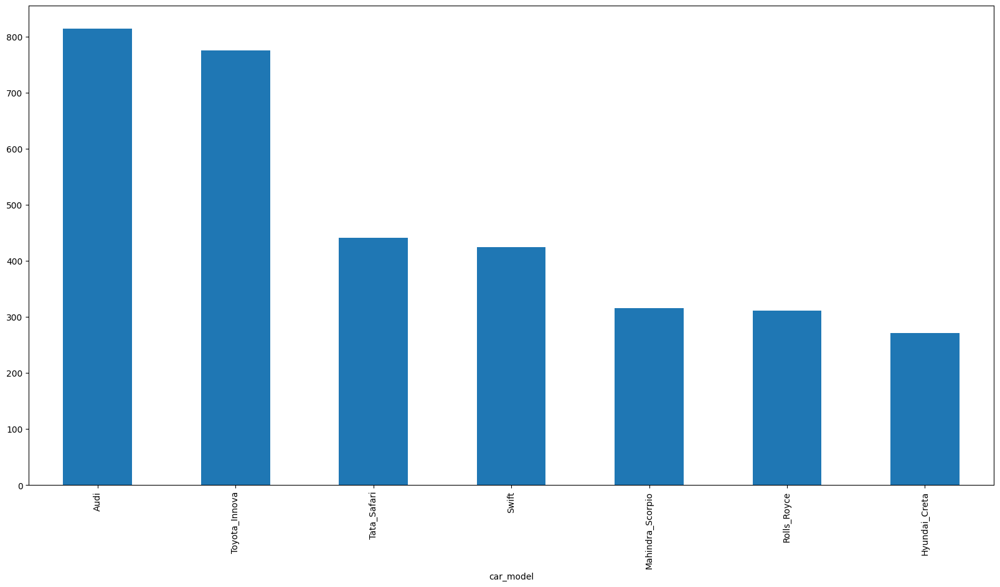

In [ ]:
labels_csv['car_model'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['car_model'].value_counts().median()

424.0

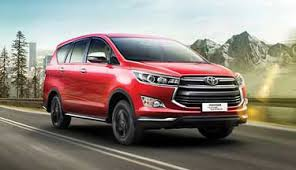

In [ ]:
from IPython.display import Image
Image( 'drive/MyDrive/Cars_Dataset/train/Toyota_Innova_973.jpg')

### Getting images and their labels

Let's get a list of all of our image file path names

In [ ]:
filenames = ['drive/MyDrive/Cars_Dataset/train/'+fname for fname in labels_csv['id']]
filenames[:5]

['drive/MyDrive/Cars_Dataset/train/Toyota_Innova_98.jpg',
 'drive/MyDrive/Cars_Dataset/train/Toyota_Innova_919.jpg',
 'drive/MyDrive/Cars_Dataset/train/Toyota_Innova_921.jpg',
 'drive/MyDrive/Cars_Dataset/train/Toyota_Innova_922.jpg',
 'drive/MyDrive/Cars_Dataset/train/Toyota_Innova_924.jpg']

In [ ]:
import os
if len(os.listdir('drive/MyDrive/Cars_Dataset/train/')) == len(filenames):
  print("Ready to GO")
else: print("Not Ready")

Ready to GO


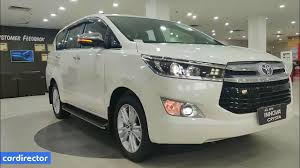

In [ ]:
Image(filenames[10])

In [ ]:
labels_csv['car_model'][10]

'Toyota_Innova'

In [ ]:
labels = labels_csv['car_model']
labels = np.array(labels)
labels

array(['Toyota_Innova', 'Toyota_Innova', 'Toyota_Innova', ...,
       'Toyota_Innova', 'Toyota_Innova', 'Toyota_Innova'], dtype=object)

In [ ]:
# Checking missing data
if len(labels) == len(filenames):
  print("No missing content")
else: print("Missing Content")

No missing content


In [ ]:
unique_cars = np.unique(labels)
len(unique_cars)

7

In [ ]:
bool_labels = [label == unique_cars for label in labels]
bool_labels[:2]

[array([False, False, False, False, False, False,  True]),
 array([False, False, False, False, False, False,  True])]

In [ ]:
# Setup X and y labels
X = filenames
y = bool_labels

Experimentation will begin with 1676 images, with the possibility of increasing the number as needed.

In [ ]:
NUM_IMAGES = 1676 #@param {type: "slider", min:500, max:4000, step:100}

In [ ]:
# Data split into train and validation
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)
len(X_train), len(X_val), len(y_train), len(y_val)


(1340, 336, 1340, 336)

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(168, 299, 3)

In [ ]:
# Setting image size
IMG_SIZE = 224

# Creating a function for pre-processing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (RED,GREEN,BLUE)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning out data into batches

In [ ]:
# Creating a function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, process the image and returns a type of (image, label)
  """

  image = process_image(image_path)
  return image, label

In [ ]:
BATCH_SIZE = 32

def get_image_label(file_path, label):
    """Load image and label, and apply basic preprocessing."""
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [224, 224])
    img = img / 255.0  # Normalize to range [0, 1]
    return img, label

def augment_image(image, label):
    """Apply data augmentation to the image."""
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=0.1)
    return image, label

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Create batches of data out of image x and label y pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also, accepts test data as input (without labels).
    """
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))  # Only filepaths
        data_batch = data.map(process_image).batch(batch_size)
        data_batch = data_batch.prefetch(tf.data.experimental.AUTOTUNE)
        return data_batch

    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))  # filepaths and labels
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

    else:
        print("Creating training data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        data = data.shuffle(buffer_size=len(x))
        # Apply augmentation only to the training set
        data = data.map(lambda x, y: augment_image(*get_image_label(x, y)), num_parallel_calls=tf.data.experimental.AUTOTUNE)
        data_batch = data.batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)
        return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checking different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 7), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 7), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots ( 5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_cars[labels[i].argmax()])
    # Turns the grid lines off
    plt.axis("off")


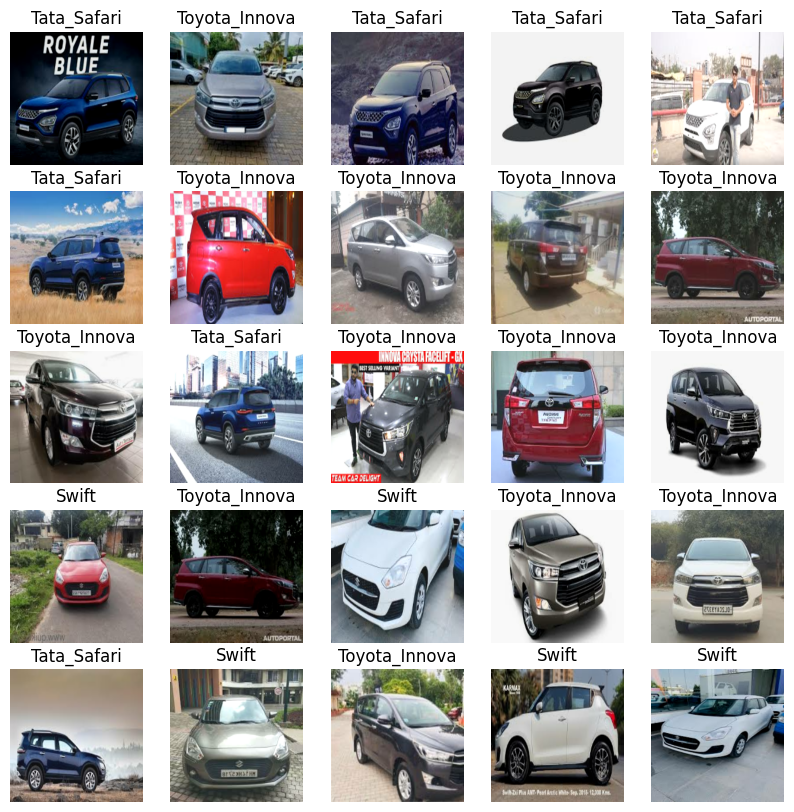

In [ ]:
# Now let's visualise the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

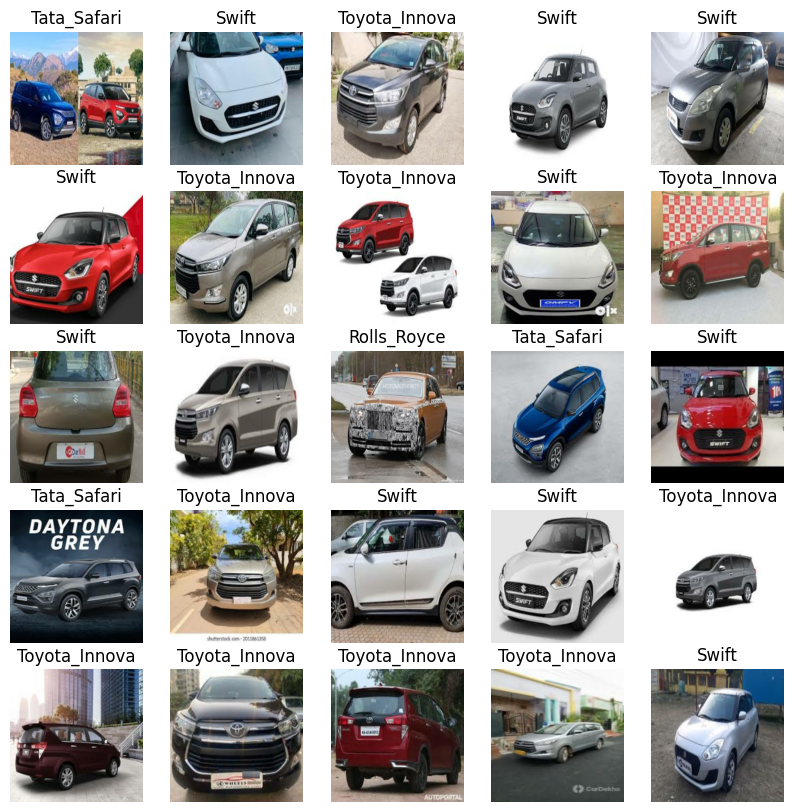

In [ ]:
# Now let's visualise validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

In [ ]:
# Setting input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setting output shape of our model
OUTPUT_SHAPE = len(unique_cars)

# Setting model URL
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-classification/1"

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building model with: ", MODEL_URL)
  model = tf.keras.Sequential([
   hub.KerasLayer(MODEL_URL, input_shape=input_shape[1:]), # Layer 1 (input layer)
   tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation = "softmax") # Layer 2(output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              4013897   
                                                                 
 dense (Dense)               (None, 7)                 7014      
                                                                 
Total params: 4020911 (15.34 MB)
Trainable params: 7014 (27.40 KB)
Non-trainable params: 4013897 (15.31 MB)
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions used by a model during training to perform tasks such as saving progress, checking progress, or stopping training early if the model stops improving.

Two callbacks will be created: one for TensorBoard, which helps track the model's progress, and another for early stopping, which prevents the model from training for too long.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Creating a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Creating a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Cars_Dataset/logs",
                        datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset)

The first model will train on only 1340 images to ensure that everything is working correctly.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:
# Building a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-classification/1
Epoch 1/100
42/42 [==============================] - 20s 310ms/step - loss: 0.9826 - accuracy: 0.6209 - val_loss: 0.4840 - val_accuracy: 0.8393
Epoch 2/100
42/42 [==============================] - 7s 168ms/step - loss: 0.3633 - accuracy: 0.8687 - val_loss: 0.3172 - val_accuracy: 0.8929
Epoch 3/100
42/42 [==============================] - 5s 126ms/step - loss: 0.2661 - accuracy: 0.9090 - val_loss: 0.2620 - val_accuracy: 0.9256
Epoch 4/100
42/42 [==============================] - 7s 158ms/step - loss: 0.1977 - accuracy: 0.9366 - val_loss: 0.2204 - val_accuracy: 0.9435
Epoch 5/100
42/42 [==============================] - 7s 168ms/step - loss: 0.1679 - accuracy: 0.9537 - val_loss: 0.2028 - val_accuracy: 0.9464
Epoch 6/100
42/42 [==============================] - 5s 118ms/step - loss: 0.1489 - accuracy: 0.9500 - val_loss: 0.1918 - val_accuracy: 0.9435
Epoch 7/100
42/42 [=======

In [ ]:
%tensorboard --logdir drive/MyDrive/Cars_Dataset/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

11/11 [==============================] - 2s 132ms/step


array([[7.17404782e-06, 1.02352303e-07, 4.19626147e-08, ...,
        9.22867954e-02, 9.00384843e-01, 7.20477430e-03],
       [3.69440058e-05, 3.52559482e-07, 1.92509947e-06, ...,
        8.79077375e-01, 8.99702217e-03, 1.11809805e-01],
       [4.77629726e-07, 2.06827579e-07, 1.73593193e-07, ...,
        1.57053431e-03, 2.87231785e-04, 9.98130620e-01],
       ...,
       [7.35843651e-06, 2.84090561e-07, 1.95910260e-07, ...,
        9.97308493e-01, 1.53953515e-05, 2.64490582e-03],
       [6.25756775e-06, 2.40215456e-07, 4.86247245e-07, ...,
        6.48273446e-04, 9.34073396e-05, 9.99012470e-01],
       [5.64830680e-06, 1.30968488e-07, 1.02937747e-07, ...,
        9.99791082e-04, 8.34073056e-04, 9.98129189e-01]], dtype=float32)

In [ ]:
predictions.shape

(336, 7)

In [ ]:
# Checking predictions
index = 7
print(f"Max value(probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_cars[np.argmax(predictions[index])]}")

Max value(probability of prediction): 0.98135906457901
Sum: 1.0
Max index: 6
Predicted label: Toyota_Innova


In [ ]:
unique_cars[6]

'Toyota_Innova'

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of predcitions into a label
  """
  return unique_cars[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[7])

In [ ]:
pred_label

'Toyota_Innova'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
## Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seprate arrays of images and label.
  """
  images =[]
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_cars[np.argmax(label)])
  return images, labels

  # Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.5372549 , 0.79607844, 0.9843137 ],
         [0.5372549 , 0.79607844, 0.9843137 ],
         [0.5372549 , 0.79607844, 0.9843137 ],
         ...,
         [0.7372549 , 0.75686276, 0.7411765 ],
         [0.7372549 , 0.75686276, 0.7411765 ],
         [0.7372549 , 0.75686276, 0.7411765 ]],
 
        [[0.5397059 , 0.7985294 , 0.9867647 ],
         [0.5397059 , 0.7985294 , 0.9867647 ],
         [0.5397059 , 0.7985294 , 0.9867647 ],
         ...,
         [0.7512167 , 0.76458776, 0.74607843],
         [0.7494661 , 0.765463  , 0.74607843],
         [0.7478905 , 0.76625085, 0.74607843]],
 
        [[0.5411765 , 0.8       , 0.9882353 ],
         [0.5411765 , 0.8       , 0.9882353 ],
         [0.5411765 , 0.8       , 0.9882353 ],
         ...,
         [0.7671699 , 0.77510506, 0.7534314 ],
         [0.7648942 , 0.77650553, 0.7534314 ],
         [0.7628458 , 0.7777661 , 0.7534314 ]],
 
        ...,
 
        [[0.9162684 , 0.7633272 , 0.6496017 ],
         [0.8044905 , 0.65154934, 0.53383

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=0):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),color=color)

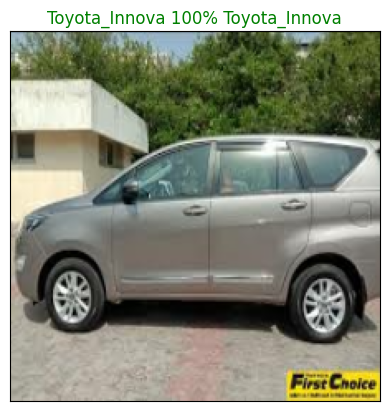

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now we've got one function to visualise our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_cars[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation="vertical")

  # Change the colour of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


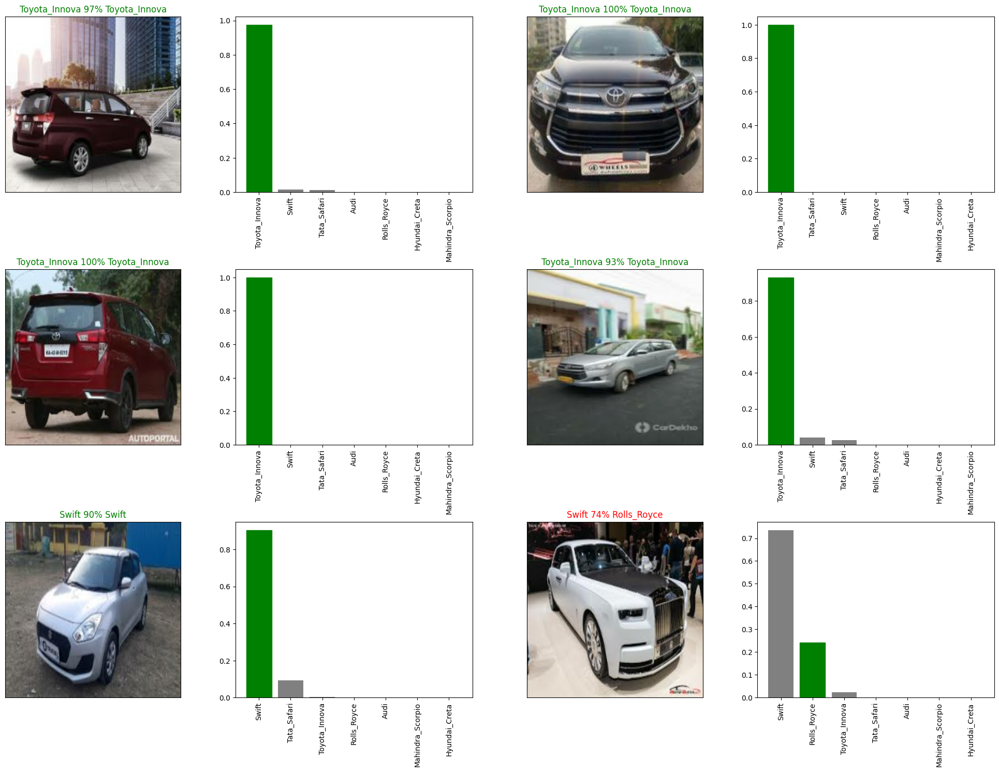

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout()
plt.show()

In [ ]:
# Evaluate on train data
print("Evaluating on Training Data...")
train_loss, train_accuracy = model.evaluate(train_data)
print(f"Train Loss: {train_loss}")
print(f"Train Accuracy: {train_accuracy}")

# Evaluate on Validation Data
print("Evaluating on Validation Data...")
val_loss, val_accuracy = model.evaluate(val_data)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

Evaluating on Training Data...
42/42 [==============================] - 4s 97ms/step - loss: 0.0580 - accuracy: 0.9888
Train Loss: 0.058006320148706436
Train Accuracy: 0.9888059496879578
Evaluating on Validation Data...
11/11 [==============================] - 1s 85ms/step - loss: 0.1628 - accuracy: 0.9464
Validation Loss: 0.1627923995256424
Validation Accuracy: 0.9464285969734192


In [ ]:
results = {
    "Dataset": ["Train", "Validation"],
    "Loss": [train_loss, val_loss],
    "Accuracy": [train_accuracy, val_accuracy]
}

In [ ]:
results_df = pd.DataFrame(results)

In [ ]:
print(results_df)

      Dataset      Loss  Accuracy
0       Train  0.058006  0.988806
1  Validation  0.162792  0.946429


## Saving and reloading a trained model

In [ ]:
# Creating a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (String).
  """
  # Creating a model directory path name with current time
  modeldir = os.path.join("drive/MyDrive/Cars_Dataset/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Creating a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load(model_path,
                               custom_object={"KerasLayer":hub.KerasLayer})
  return model

The functions for saving and loading a trained model have been created.

In [ ]:
# Saves the trained model
save_model(model, suffix="images-mobilenetv3-Adam")

Saving model to : drive/MyDrive/Cars_Dataset/models/20240522-11521716378756-images-mobilenetv3-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Cars_Dataset/models/20240522-11521716378756-images-mobilenetv3-Adam.h5'

In [ ]:
# Loading a trained model
image_model = tf.keras.models.load_model(
    "drive/MyDrive/Cars_Dataset/models/20240522-11521716378756-images-mobilenetv3-Adam.h5",
    custom_objects={'KerasLayer': hub.KerasLayer}
)

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

11/11 [==============================] - 1s 84ms/step - loss: 0.1628 - accuracy: 0.9464


[0.1627923995256424, 0.9464285969734192]

In [ ]:
# Evaluate the loaded model
image_model.evaluate(val_data)

11/11 [==============================] - 2s 89ms/step - loss: 0.1628 - accuracy: 0.9464


[0.1627923995256424, 0.9464285969734192]

## Training on the full data

In [ ]:
len(X), len(y)

(3352, 3352)

In [ ]:
len(X_train)

1340

In [ ]:
# Creating a data batch with  the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 7), dtype=tf.bool, name=None))>

In [ ]:
# Creating a model for full model
full_model = create_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-classification/1


In [ ]:
# Creating full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
105/105 [==============================] - 19s 111ms/step - loss: 1.0594 - accuracy: 0.6372
Epoch 2/100
105/105 [==============================] - 12s 111ms/step - loss: 0.5446 - accuracy: 0.8261
Epoch 3/100
105/105 [==============================] - 12s 112ms/step - loss: 0.4379 - accuracy: 0.8604
Epoch 4/100
105/105 [==============================] - 12s 111ms/step - loss: 0.3651 - accuracy: 0.8890
Epoch 5/100
105/105 [==============================] - 11s 103ms/step - loss: 0.3225 - accuracy: 0.9063
Epoch 6/100
105/105 [==============================] - 11s 104ms/step - loss: 0.2903 - accuracy: 0.9168
Epoch 7/100
105/105 [==============================] - 12s 112ms/step - loss: 0.2636 - accuracy: 0.9209
Epoch 8/100
105/105 [==============================] - 11s 109ms/step - loss: 0.2340 - accuracy: 0.9329
Epoch 9/100
105/105 [==============================] - 12s 117ms/step - loss: 0.2232 - accuracy: 0.9388
Epoch 10/100
105/105 [==============================] - 12s 116m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv3-Adam")

Saving model to : drive/MyDrive/Cars_Dataset/models/20240522-12021716379327-full-image-set-mobilenetv3-Adam.h5...


'drive/MyDrive/Cars_Dataset/models/20240522-12021716379327-full-image-set-mobilenetv3-Adam.h5'

In [ ]:
loaded_full_model = tf.keras.models.load_model(
    "drive/MyDrive/Cars_Dataset/models/20240522-12021716379327-full-image-set-mobilenetv3-Adam.h5",
    custom_objects={'KerasLayer': hub.KerasLayer})

# Model Testing

## Making predictions on the test dataset

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Cars_Dataset/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Cars_Dataset/test/1000.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1220.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1027.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1204.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1224.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1008.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1103.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1241.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1022.jpg',
 '/content/drive/MyDrive/Cars_Dataset/test/1086.jpg']

In [ ]:
len(test_filenames)

813

In [ ]:
# Creating test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
print(test_data)

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>


In [ ]:
# Making predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(x=test_data,
                                             verbose=1)

26/26 [==============================] - 96s 4s/step


In [ ]:
# Save predictions (Numpy Array) to csv file (for later access)
np.savetxt("/content/drive/MyDrive/Cars_Dataset/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy Array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Cars_Dataset/preds_array.csv", delimiter=",")

In [ ]:
test_predictions.shape

(813, 7)

In [ ]:
predicted_labels = np.argmax(test_predictions, axis=1)

## Preparing test dataset

In [ ]:
# Creating a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_cars))

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
# Add the prediction probabilities to each car name column
preds_df[list(unique_cars)] = test_predictions
preds_df.sample(5)

,id,Audi,Hyundai_Creta,Mahindra_Scorpio,Rolls_Royce,Swift,Tata_Safari,Toyota_Innova
529,676,0.009688,0.001237,1.011891e-06,4.350256e-08,0.983634,0.000040,0.005400
486,7645,0.088193,0.002974,3.351767e-05,1.088292e-06,0.899272,0.000033,0.009493
666,299,0.015790,0.468786,2.314703e-03,2.618860e-04,0.035995,0.001850,0.475003
558,273,0.036017,0.000017,4.011182e-04,1.208665e-06,0.000145,0.963229,0.000190
732,56,0.000128,0.000149,1.575140e-07,1.054199e-06,0.000243,0.001163,0.998316


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Cars_Dataset/full_model_predictions_submission_1_mobilenetV3.csv",
               index=False)

## Making predictions on custom images

In [ ]:
# Setting Custom image file path
custom_path = "/content/drive/MyDrive/My_Cars/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 719ms/step


In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['Audi',
 'Rolls_Royce',
 'Mahindra_Scorpio',
 'Mahindra_Scorpio',
 'Swift',
 'Audi',
 'Rolls_Royce',
 'Hyundai_Creta',
 'Toyota_Innova',
 'Tata_Safari']

In [ ]:
# Get custom images (unbaticfy function won't work because there aren't labels)
custom_image = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_image.append(image)

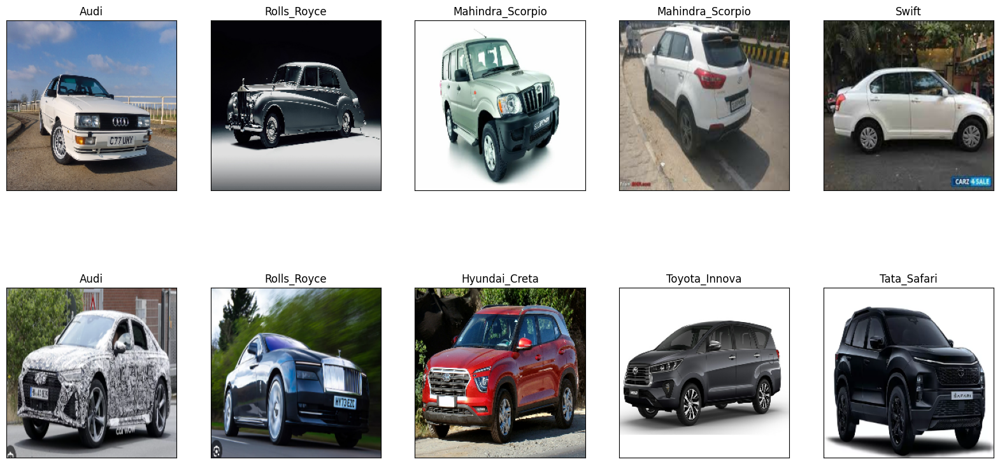

In [ ]:
# Check custom predictions
plt.figure(figsize=(20, 10))
for i, image in enumerate(custom_image):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

The model predicted 9 images out of 10 corectly.